<center><img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;"></center>

# <center> Проект: Анализ резюме из HeadHunter
   

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re

# Исследование структуры данных

### 1. Прочитайте данные с помощью библиотеки Pandas. 
Совет: перед чтением обратите внимание на разделитель внутри файла.

In [2]:
df = pd.read_csv('data/dst-3.0_16_1_hh_database.zip', compression='zip', sep=';', encoding='utf-8', engine='python') 

### 2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [3]:
display(df.head())
display(df.tail())

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
44739,"Мужчина , 30 лет , родился 17 января 1989",50000 руб.,"Финансист, аналитик, экономист, бухгалтер, мен...","Тверь , готов к переезду (Москва, Химки) , гот...",полная занятость,"полный день, удаленная работа","Опыт работы 7 лет 7 месяцев Финансист, аналит...","ООО ""IAS"" (независимый участник объединения Ru...",Руководитель субгруппы,Высшее образование 2015 Московский гуманитарн...,22.04.2019 12:32,Не указано
44740,"Мужчина , 27 лет , родился 5 марта 1992",39000 руб.,"Системный администратор, IT-специалист","Липецк , готов к переезду , готов к командировкам","проектная работа, частичная занятость, полная ...","удаленная работа, гибкий график, полный день, ...","Опыт работы 7 лет Системный администратор, IT...",ИП Пестрецов,Предприниматель,Высшее образование (Бакалавр) 2016 Воронежски...,22.04.2019 13:11,Не указано
44741,"Женщина , 48 лет , родилась 26 декабря 1970",40000 руб.,"Аналитик данных, Математик","Челябинск , готова к переезду , готова к редки...",полная занятость,"полный день, удаленная работа",Опыт работы 21 год 5 месяцев Январь 1998 — по...,"ОАО «ЧМК», Исследовательско-Технологический Це...",Начальник группы аналитики,Высшее образование 2000 Южно-Уральский госуда...,09.04.2019 05:07,Не указано
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль
44743,"Мужчина , 38 лет , родился 25 апреля 1980",120000 руб.,Руководитель проекта,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 15 лет 10 месяцев Руководитель пр...,ПАО ГК ТНС энерго,Руководитель отдела технической поддержки,Высшее образование 1997 Южно-Российский госуд...,05.07.2018 20:15,Не указано


### 3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

### 4. Обратите внимание на информацию о числе непустых значений.

In [4]:
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

None

### 5. Выведите основную статистическую информацию о столбцах.

In [5]:
display(df.describe(include=['object']))

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 2014 Московский технически...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

### 1. Начнем с простого - с признака **"Образование и ВУЗ"**. 
Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**.      
Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…           

Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [6]:
def classify_education(education_str):
    """Классифицирует уровень образования по заданным категориям."""
    education = education_str.lower().split(' ')
    if education[0] == 'высшее':
        return 'высшее'
    elif education[0] == 'неоконченное':
        return 'неоконченное высшее'
    elif education[1] == 'специальное':
        return 'среднее специальное'
    elif education[0] == 'среднее':
        return 'среднее'

# Добавим признак "Образование" и проверим количество уникальных категорий
df_copy = df.copy()
df_copy['Образование'] = df_copy['Образование и ВУЗ'].apply(classify_education)

print(f"Количество уникальных значений в признаке 'Образование': {df_copy['Образование'].nunique()}")
print(f'Количество пропусков в признаке "Образование": {df_copy["Образование"].isnull().sum()}')
print(f"Количество соискателей со средним уровнем образования: {df_copy['Образование'].value_counts().loc['среднее']}")

df_copy = df_copy.drop(['Образование и ВУЗ'], axis=1)

Количество уникальных значений в признаке 'Образование': 4
Количество пропусков в признаке "Образование": 0
Количество соискателей со средним уровнем образования: 559


### 2. Теперь нас интересует столбец **"Пол, возраст"**.  
Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [7]:
# Преобразуем столбец "Пол, возраст" в "Пол" и "Возраст"
df_copy['Пол'] = df_copy['Пол, возраст'].apply(lambda x: x.split(',')[0][0])
df_copy['Возраст'] = df_copy['Пол, возраст'].apply(lambda x: int(''.join(filter(str.isdigit, x.split(',')[1]))))

# Расчёт процента резюме женского пола и среднего возраста
female_resumes_percent = round(df_copy['Пол'].value_counts(normalize=True).get('Ж', 0)*100, 2)
average_age = round(df_copy['Возраст'].mean(), 1)

print(f"Резюме соискателей женского пола составляют: {female_resumes_percent}%")
print(f"Средний возраст соискателей составляет: {average_age} года")

# Удаляем исходный столбец
df_copy.drop(['Пол, возраст'], axis=1, inplace=True)


Резюме соискателей женского пола составляют: 19.07%
Средний возраст соискателей составляет: 32.2 года


### 3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [8]:
def calculate_experience_in_months(str):
    year_keywords = ['лет', 'года', 'год']
    month_keywords = ['месяц','месяца', 'месяцев']
    years = 0
    months = 0
    if str == "Не указано" or str is np.nan:
        return np.nan
    else:
        str = str.split(' ')        
        for num in range(6):        
            if str[num] in year_keywords:
                years = int(str[num-1])
            elif str[num] in month_keywords:
                months = int(str[num-1])
            else:
                continue

    return years*12 + months

df_copy['Опыт работы (месяц)'] = df_copy['Опыт работы'].apply(calculate_experience_in_months)
print(f"Медианное значение опыта работы: {df_copy['Опыт работы (месяц)'].median()} месяцев")

df_copy = df_copy.drop(['Опыт работы'], axis=1)

Медианное значение опыта работы: 100.0 месяцев


### 4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". 
Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [9]:
def determine_city(location):
    million_plus_cities = [
        'Новосибирск', 'Екатеринбург', 'Нижний Новгород',
        'Казань', 'Челябинск', 'Омск', 'Самара', 'Ростов-на-Дону',
        'Уфа', 'Красноярск', 'Пермь', 'Воронеж', 'Волгоград'
    ]
    parts = location.split(' ')
    if parts[0] == 'Москва':
        return 'Москва'
    elif parts[0] == 'Санкт-Петербург':
        return 'Санкт-Петербург'
    elif parts[0] in million_plus_cities:
        return 'город-миллионник'
    else:
        return 'другие'

def assess_relocation_readiness(text):
    elements = text.split(',')
    for element in elements:
        if re.findall(r'ерее', element) == ['ерее']:
            if ('готов' in element or 'хочу' in element) and ('не готов' not in element):
                return True
            else:
                return False

def evaluate_business_trip_readiness(text):
    if 'командировка' in text:
        if (re.findall(r'не готов к командировкам', text) == ['не готов к командировкам']) \
        or (re.findall(r'не готова к командировкам', text) == ['не готова к командировкам']):
            return False
        else:
            return True
    else:
        return False
    
# Применение функций и сохранение результатов в исходные столбцы
df_copy['Город'] = df_copy['Город, переезд, командировки'].apply(determine_city)
df_copy['Готовность к переезду'] = df_copy['Город, переезд, командировки'].apply(assess_relocation_readiness)
df_copy['Готовность к командировкам'] = df_copy['Город, переезд, командировки'].apply(evaluate_business_trip_readiness)

# Вывод информации
display(df_copy['Город'].value_counts())
display(df_copy['Готовность к переезду'].value_counts())
display(df_copy['Готовность к командировкам'].value_counts())

percent_in_spb = round(df_copy['Город'].value_counts(normalize=True) * 100)['Санкт-Петербург']
willingness_percentage = round(df_copy[df_copy['Готовность к командировкам'] & df_copy['Готовность к переезду']].shape[0] / df_copy.shape[0] * 100)

print(f"В Санкт-Петербурге проживает {percent_in_spb}% соискателей")
print(f"К переезду и командировкам готово {willingness_percentage}% соискателей")

# Удаление исходного столбца
df_copy = df_copy.drop(['Город, переезд, командировки'], axis=1)

Город
Москва              16621
другие              16452
город-миллионник     6734
Санкт-Петербург      4937
Name: count, dtype: int64

Готовность к переезду
False    28719
True     16025
Name: count, dtype: int64

Готовность к командировкам
True     31640
False    13104
Name: count, dtype: int64

В Санкт-Петербурге проживает 11.0% соискателей
К переезду и командировкам готово 32% соискателей


### 5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>     
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [10]:
df_copy['полная занятость'] = df_copy['Занятость'].apply(lambda x: True if 'полная занятость' in x else False)
df_copy['частичная занятость'] = df_copy['Занятость'].apply(lambda x: True if 'частичная занятость' in x else False)
df_copy['проектная работа'] = df_copy['Занятость'].apply(lambda x: True if 'проектная работа' in x else False)
df_copy['волонтерство'] = df_copy['Занятость'].apply(lambda x: True if 'волонтерство' in x else False)
df_copy['стажировка'] = df_copy['Занятость'].apply(lambda x: True if 'стажировка' in x else False)

df_copy['полный день'] = df_copy['График'].apply(lambda x: True if 'полный день' in x else False)
df_copy['сменный график'] = df_copy['График'].apply(lambda x: True if 'сменный график' in x else False)
df_copy['гибкий график'] = df_copy['График'].apply(lambda x: True if 'гибкий график' in x else False)
df_copy['удаленная работа'] = df_copy['График'].apply(lambda x: True if 'удаленная работа' in x else False)
df_copy['вахтовый метод'] = df_copy['График'].apply(lambda x: True if 'вахтовый метод' in x else False)

interested_in_project_work_and_volunteering = (df_copy['проектная работа'] == True) & (df_copy['волонтерство'] == True)
open_to_shift_work_and_flexible_schedule = (df_copy['вахтовый метод'] == True) & (df_copy['гибкий график'] == True)

print(f'Количество соискателей ищущих проектную работу и волонтёрство: {df_copy[interested_in_project_work_and_volunteering].shape[0]} человек')
print(f'Количество соискателей, которые хотят работать вахтовым методом и с гибким графиком: {df_copy[open_to_shift_work_and_flexible_schedule].shape[0]} человек')

df_copy = df_copy.drop(['Занятость', 'График'], axis=1)

Количество соискателей ищущих проектную работу и волонтёрство: 436 человек
Количество соискателей, которые хотят работать вахтовым методом и с гибким графиком: 2311 человек


### 6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [11]:
# Преобразуем дату в формат datetime и извлекаем дату
df_copy['Обновление резюме'] = pd.to_datetime(df_copy['Обновление резюме'], dayfirst=True)
df_copy['Обновление резюме'] = df_copy['Обновление резюме'].dt.date

# Считываем таблицу с валютами и преобразуем дату в формат datetime
df_rates = pd.read_csv(
    'data/ExchangeRates.zip',
    compression='zip',
    usecols=[
        "currency",
        "date",
        "proportion",
        "close"
        ]
    )
df_rates['date'] = pd.to_datetime(df_rates['date'], dayfirst=True)

# Создаем новые признаки с суммой желаемой зарплаты в числовом формате и наименование валюты
df_copy['currency'] = df_copy['ЗП'].apply(lambda x: x.split()[1])
df_copy['sum'] = df_copy['ЗП'].apply(lambda x: x.split()[0])
df_copy['sum'] = df_copy['sum'].astype('float')

# Наименование валюты переводим в стандарт ISO
cur_dict ={
    'руб.':'RUB',
    'грн.':'UAH',
    'USD':'USD',
    'EUR':'EUR',
    'бел.руб.':'BYN',
    'KGS':'KGS',
    'сум':'UZS',
    'AZN':'AZN',
    'KZT':'KZT'
    }
df_copy['currency'] = df_copy['currency'].apply(lambda x: cur_dict[x])

# Объеденяем две таблицы по признаку валюты и дате
df = df_copy.copy()
df['Обновление резюме'] = pd.to_datetime(df['Обновление резюме'])
df = df.merge(
    df_rates,
    left_on=['currency', 'Обновление резюме'],
    right_on=['currency', 'date'],
    how='left'
    )

# Заполним отсутствующие значения close и proportion единицей для рубля
df['close'] = df['close'].fillna(1)
df['proportion'] = df['proportion'].fillna(1)

# Создадим новый признак, содержащий желаемую зарплату в рублях
df['ЗП (руб)'] = (df['sum'] * df['close']) / df['proportion']

# Удалим вспомагательные признаки
df = df.drop(['ЗП','currency', 'sum', 'date', 'close', 'proportion'], axis=1)

# Задание 3.6
#Чему равна желаемая медианная заработная плата соискателей в нашей таблице (в рублях)?
#Ответ приведите в тысячах рублей и округлите до целого. 
# Например, если у вас получилась медианная з/п 42 127, в качестве ответа укажите 42.
x = round(df['ЗП (руб)'].median() / 1000)
print(f"Медианное значение заработной платы составляет {x} тысяч рублей.")

/tmp/ipykernel_33530/1495530341.py:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_rates['date'] = pd.to_datetime(df_rates['date'], dayfirst=True)


Медианное значение заработной платы составляет 59 тысяч рублей.


# Исследование зависимостей в данных

### 1. Постройте распределение признака **"Возраст"**. 
Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

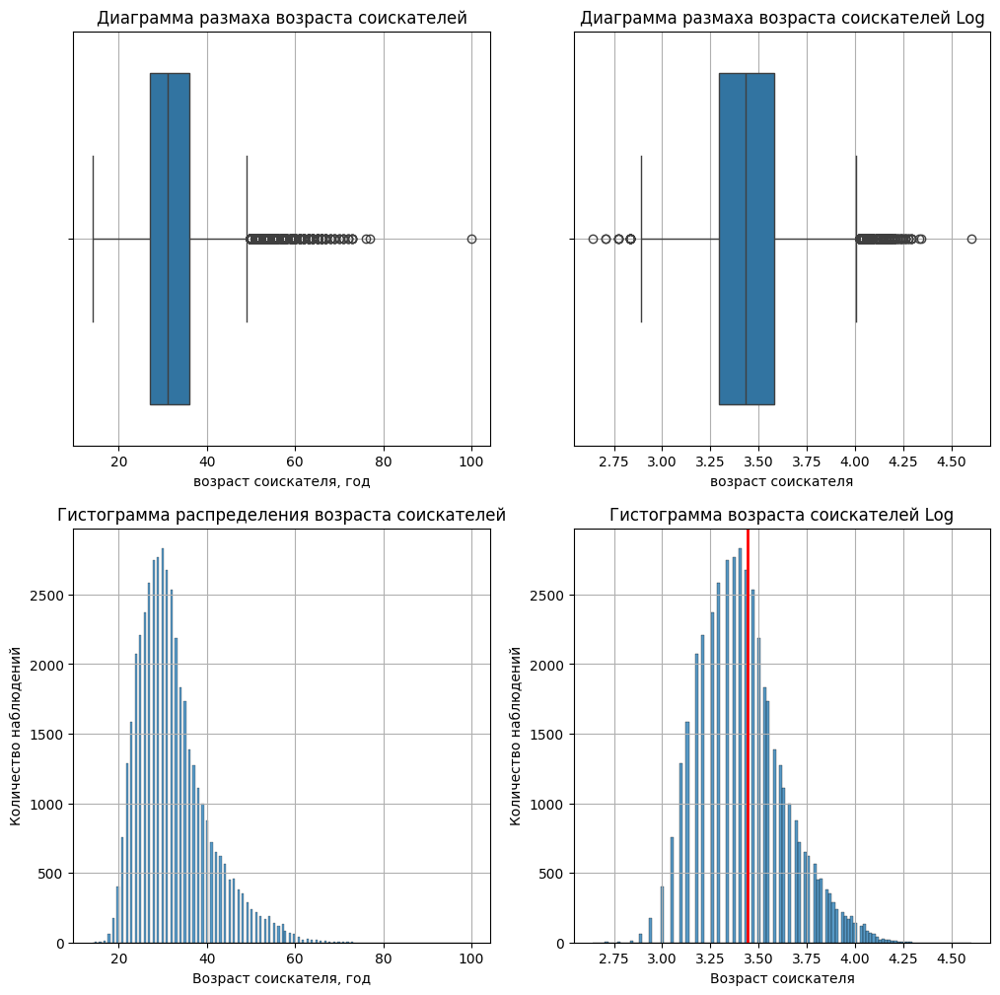

Показатель ассиметрии: 0.45


In [12]:
# Создаем гистограмму
fig = px.histogram(
    data_frame=df,
    x='Возраст',   
    marginal='box',
    width=800,
    height=500,
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение возраста соискателей',
    title_x = 0.5,
    xaxis_title='Возраст соискателей, год',
    yaxis_title='Число наблюдений'
    )

fig.show()

# Создаем гистограмму для пролагорифмированного распределения возраста соискателей
fig = px.histogram(
    data_frame=df,
    x=np.log(df['Возраст']),   
    marginal='box',
    width=800,
    height=500,
    )
# Строим линию среднего значения для определения ассиметрии распределения
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='solid',
    x0=np.log(df['Возраст']).mean(),
    x1=np.log(df['Возраст']).mean(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение возраста соискателей Log',
    title_x = 0.5,
    xaxis_title='Возраст соискателей',
    yaxis_title='Число наблюдений'
    )
    
fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха для признака возраст
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
bx = sns.boxplot(
    data=df,
    x='Возраст',   
    orient='h',
    ax=axes[0][0]
    )

# Повышаем информативность
bx.set_title('Диаграмма размаха возраста соискателей')
bx.set_xlabel('возраст соискателя, год')
bx.grid()

# Создаем гистограмму для признака возраст
hist = sns.histplot(
    data=df,
    x='Возраст',
    ax=axes[1][0])

# Повышаем информативность
hist.set_title('Гистограмма распределения возраста соискателей')
hist.set_xlabel('Возраст соискателя, год') 
hist.set_ylabel('Количество наблюдений')
hist.grid()

# Создаем диаграмму размаха для пролагорифмированного распределения
bx = sns.boxplot(
    data=df,
    x=np.log(df['Возраст']),   
    orient='h',
    ax=axes[0][1]
    )

# Повышаем информативность
bx.set_title('Диаграмма размаха возраста соискателей Log')
bx.set_xlabel('возраст соискателя')
bx.grid()

# Создаем гистограмму для пролагорифмированного распределения
hist = sns.histplot(
    data=df, 
    x=np.log(df['Возраст']),
    ax=axes[1][1])
# Строим линию среднего значения для определения ассиметрии распределения
hist.axvline(np.log(df['Возраст']).mean(), color='r', lw='2')

# Повышаем информативность
hist.set_title('Гистограмма возраста соискателей Log')
hist.set_xlabel('Возраст соискателя') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
plt.show()

# Вычислим численный показатель ассиметрии рапределения
print('Показатель ассиметрии:', round(np.log(df['Возраст']).skew(), 2))

**Выводы**

- Распределение возраста соискателей напоминает логнормальное, с множеством потенциальных выбросов на правом конце.
- После логарифмирования, распределение приближается к нормальному с небольшой правой асимметрией.
- Показатель асимметрии составляет 0,45, указывая на правую асимметрию.
- Модальный возраст соискателей — 30 лет, с диапазоном значений от 14 до 100 лет.
- Большинство возрастов соискателей лежит в интервале от 22 до 36 лет.
- Возраст 100 лет выделяется как аномалия, но большое количество старших соискателей не обязательно указывает на аномальность данных.\

Чему равно модальное значение возраста соискателей?         
Модальное значение возраста соискателей 30 лет.


### 2. Постройте распределение признака **"Опыт работы (месяц)"**. 
Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

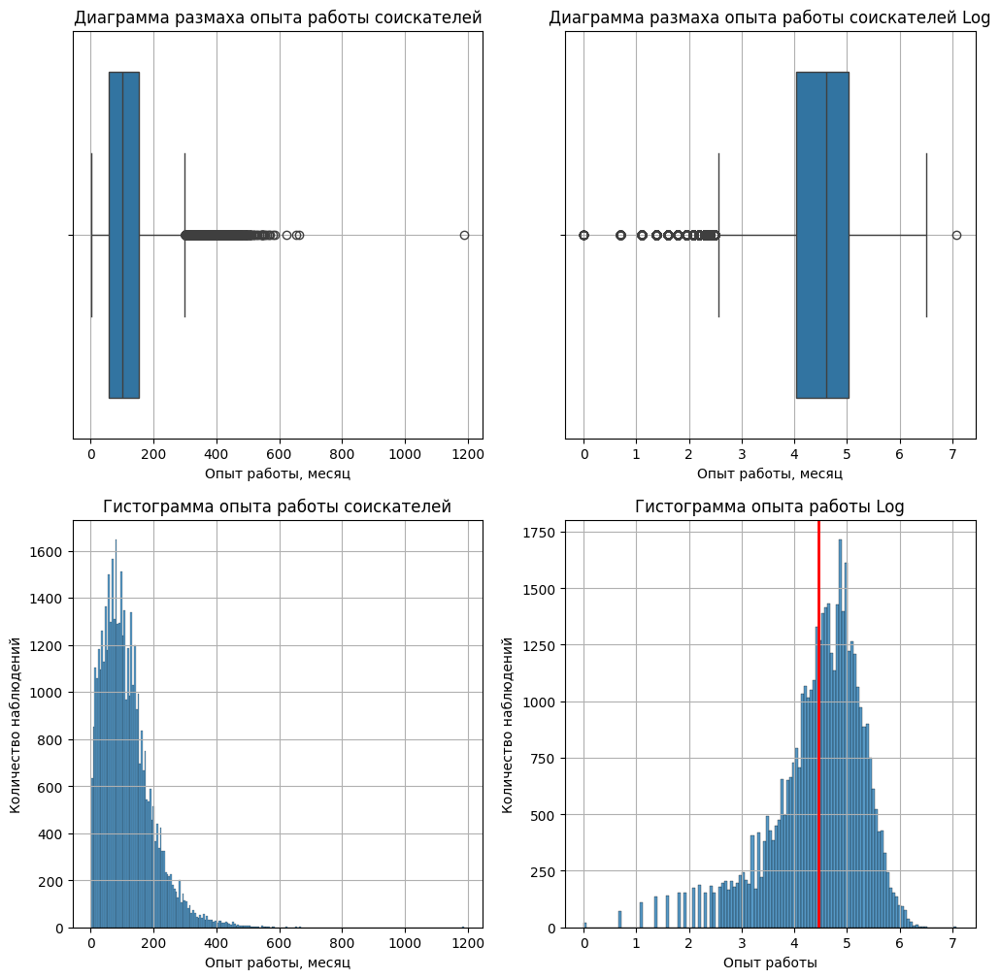

Показатель ассиметрии: -1.11
Модальное значение опыта работы: 81.0


In [13]:
# Создаем гистограмму
fig = px.histogram(
    data_frame=df,
    x='Опыт работы (месяц)',
    marginal='box',
    width=800,
    height=500,
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение опыт работы соискателей в месяцах',
    title_x = 0.5,
    xaxis_title='Опыт работы, месяц',
    yaxis_title='Число наблюдений'
    )

fig.show()

# Создаем гистограмму для пролагорифмированного распределния
fig = px.histogram(
    data_frame=df,
    x=np.log(df['Опыт работы (месяц)']),   
    marginal='box',
    width=800,
    height=500,
    )
# Строим линию среднего значения для определения ассиметрии распределения
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='solid',
    x0=np.log(df['Опыт работы (месяц)']).mean(),
    x1=np.log(df['Опыт работы (месяц)']).mean(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение опыт работы соискателей в месяцах Log',
    title_x = 0.5,
    xaxis_title='Опыт работы',
    yaxis_title='Число наблюдений'
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
box = sns.boxplot(
    data=df,
    x='Опыт работы (месяц)',   
    orient='h',
    ax=axes[0][0]
    )

# Повышаем информативность
box.set_title('Диаграмма размаха опыта работы соискателей')
box.set_xlabel('Опыт работы, месяц')
box.grid()

# Создаем гистограмму 
hist = sns.histplot(
    data=df,
    x='Опыт работы (месяц)',
    ax=axes[1][0]
    )

# Повышаем информативность
hist.set_title('Гистограмма опыта работы соискателей')
hist.set_xlabel('Опыт работы, месяц') 
hist.set_ylabel('Количество наблюдений')
hist.grid()

# Создаем диаграмму размаха для пролагорифмированного распределения
box = sns.boxplot(
    data=df,
    x=np.log(df['Опыт работы (месяц)']),   
    orient='h',
    ax=axes[0][1]
    )

# Повышаем информативность
box.set_title('Диаграмма размаха опыта работы соискателей Log')
box.set_xlabel('Опыт работы, месяц')
box.grid()
 
# Создаем гистограмму для пролагорифмированного распределения
hist = sns.histplot(
    data=df, 
    x=np.log(df['Опыт работы (месяц)']),
    ax=axes[1][1]
    )

# Строим линию среднего значения для определения ассиметрии распределения
hist.axvline(np.log(df['Опыт работы (месяц)']).mean(), color='r', lw='2')

# Повышаем информативность
hist.set_title('Гистограмма опыта работы Log')
hist.set_xlabel('Опыт работы') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
plt.show()

# Вычислим численный показатель ассиметрии рапределения
print('Показатель ассиметрии:', round(np.log(df['Опыт работы (месяц)']).skew(), 2))
# Вычислим модальное значение так как на графике оно показано интервалом от 80 до 84 месяцев
print('Модальное значение опыта работы:', df['Опыт работы (месяц)'].mode()[0])

**Выводы**

- Исходное распределение опыта работы соискателей ближе к логнормальному.
- Логарифмирование данных показывает сильную левую асимметрию.
- Показатель асимметрии As = -1,11 указывает на левую асимметрию распределения.
- Модальное значение опыта работы — 81 месяц, с диапазоном от 1 до 1188 месяцев.
- Большинство опыта работы соискателей лежит в пределах от 5 до 154 месяцев.
- Опыт работы в 1188 месяцев (99 лет) выделяется как аномалия, особенно учитывая, что предельный возраст соискателей — 77 лет.
- Наличие выбросов с опытом работы около 600 месяцев подчеркивает наличие соискателей старшего возраста, подтвержденное предыдущим анализом возраста.

Чему равен максимальный опыт работы (в месяцах)?
Максимальный опыт работы 1188  месяца.

### 3. Постройте распределение признака **"ЗП (руб)"**. 
Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака заработной платы? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


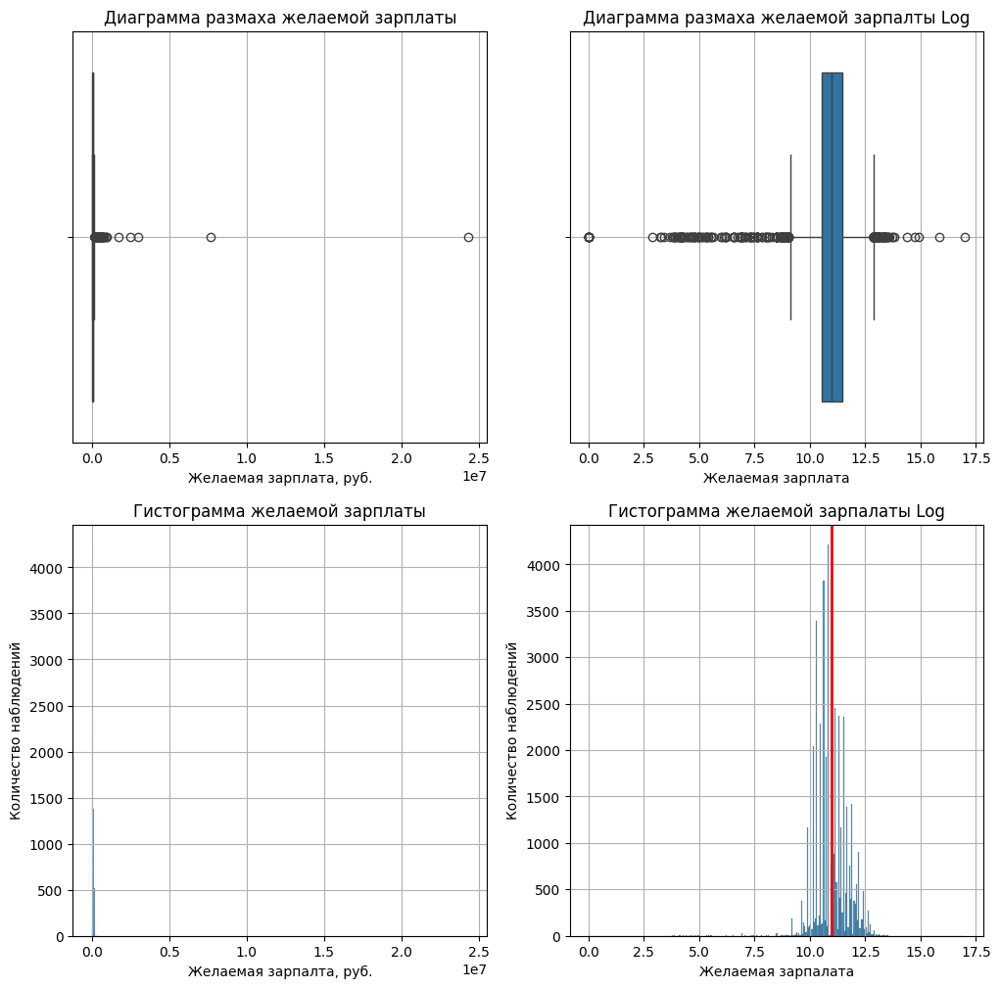

Показатель ассиметрии: -1.64
Модальное значение желаемой зарплаты: 50000.0


In [14]:
# Создаем гистограмму
fig = px.histogram(
    data_frame=df,
    x='ЗП (руб)',   
    marginal='box',
    width=800,
    height=500,
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение желаемой зарплаты соискателей',
    title_x = 0.5,
    xaxis_title='Желаемая зарплата, руб.',
    yaxis_title='Число наблюдений'    
    )
# Для изменения масштаба отображения можно использовать:
# fig.update_xaxes(range = [0,100000])
fig.show()

# Создаем гистограмму для пролагорифмированного распределния
fig = px.histogram(
    data_frame=df,
    x=np.log(df['ЗП (руб)']),   
    marginal='box',
    width=800,
    height=500,
    )
# Строим линию среднего значения для определения ассиметрии распределения
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='solid',
    x0=np.log(df['ЗП (руб)']).mean(),
    x1=np.log(df['ЗП (руб)']).mean(),
    xref='x',
    y0=0,
    y1=4500,
    yref='y'
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение желаемой зарплаты соискателей Log',
    title_x = 0.5,
    xaxis_title='Желаемая зарплата',
    yaxis_title='Число наблюдений'
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
bx = sns.boxplot(
    data=df,
    x='ЗП (руб)',   
    orient='h',
    ax=axes[0][0]
    )

# Повышаем информативность
bx.set_title('Диаграмма размаха желаемой зарплаты')
bx.set_xlabel('Желаемая зарплата, руб.')
bx.grid()

# Создаем гистограмму 
hist = sns.histplot(
    data=df,
    x='ЗП (руб)',
    ax=axes[1][0],
    )

# Повышаем информативность
hist.set_title('Гистограмма желаемой зарплаты')
hist.set_xlabel('Желаемая зарпалта, руб.') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
# Для изменения масштаба отображения можно использовать:
# hist.set_xlim(0, 100000)

# Создаем диаграмму размаха для пролагорифмированного распределения
box = sns.boxplot(
    data=df,
    x=np.log(df['ЗП (руб)']),   
    orient='h',
    ax=axes[0][1]
    )

# Повышаем информативность
box.set_title('Диаграмма размаха желаемой зарпалты Log')
box.set_xlabel('Желаемая зарплата')
box.grid()

# Создаем гистограмму для пролагорифмированного распределения
hist = sns.histplot(
    data=df, 
    x=np.log(df['ЗП (руб)']),
    ax=axes[1][1])
# Строим линию среднего значения для определения ассиметрии распределения
hist.axvline(np.log(df['ЗП (руб)']).mean(), color='r', lw='2')

# Повышаем информативность
hist.set_title('Гистограмма желаемой зарпалаты Log')
hist.set_xlabel('Желаемая зарпалата') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
plt.show()

# Вычислим численный показатель ассиметрии рапределения
print('Показатель ассиметрии:', round(np.log(df['ЗП (руб)']).skew(), 2))
# Вычислим точное модальное значение, на гистограмме оно находится 
# в интервале от 47,5 до 52,49 тысяч
print('Модальное значение желаемой зарплаты:', df['ЗП (руб)'].mode()[0])

**Выводы**

- Большинство соискателей указывают желаемую зарплату в диапазоне от 25 000 до 100 000 рублей.
- Модальное значение заработной платы составляет 50 000 рублей.
- Предельные значения желаемой заработной платы варьируются от 1 рубля до более 24 миллионов рублей.
- Аномальными считаются значения заработной платы свыше 1 м рублей, на графике таких наблюдений выделено 5.
- Также замечена аномалия в виде значения, близкого к нулю, вероятно, указывающего на опечатку соискателя.
- Из-за наличия значений, сильно отличающихся от большинства, графики (гистограмма и диаграмма размаха) трудночитаемы, что указывает на значительные выбросы.

Определите по графику, сколько соискателей требуют заработную плату выше 1 миллиона рублей.
На диаграмме размаха видно 5 наблюдений больше 1 миллиона рублей. 

### 4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). 
Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

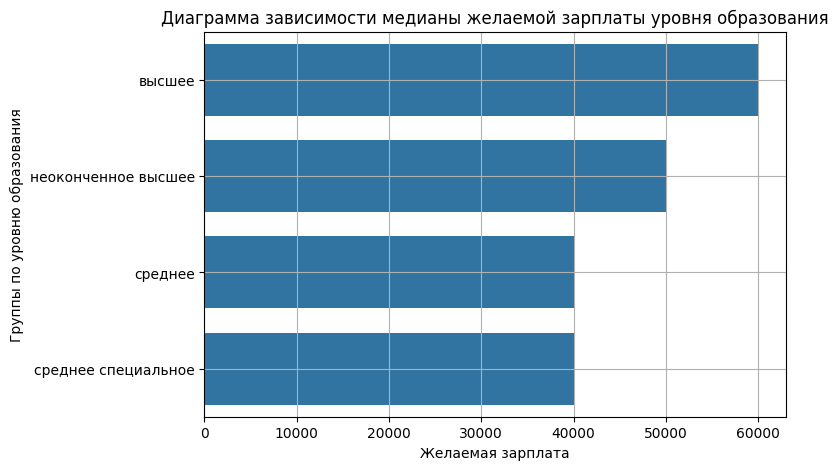

In [15]:
# Фильтруем данные по критерию величины заработной платы меньше миллиона рублей 
# и группируем по признаку образования
mask = (df['ЗП (руб)'] < 1000000)
data = df[mask].groupby('Образование', as_index=False)['ЗП (руб)'].median()

# Строим столбчатую диаграмму
fig = px.bar(
    data_frame=data,
    height=500,
    width=840,
    x='ЗП (руб)',
    y='Образование',
    color='Образование'    
    )

# Настраиваем отображение
fig.update_layout(
    title='Диаграмма зависимости медианы желаемой зарплаты уровня образования',
    title_x = 0.5,
    xaxis_title='Желаемая зарплата',
    yaxis_title='Группы по уровню образования',
    legend=dict(title='Уровень образования')
    )

fig.show()

# Строим график в Seaborn для отображения на GitHub
# Строим столбчатую диаграмму
fig = plt.figure(figsize=(7.5, 5))
bar = sns.barplot(
    data,
    x='ЗП (руб)',
    y='Образование',
    width=-0.75     
    )

# Повышаем информативность
bar.set_title('Диаграмма зависимости медианы желаемой зарплаты уровня образования')
bar.set_xlabel('Желаемая зарплата')
bar.set_ylabel('Группы по уровню образования')
bar.grid()

plt.show()

**Выводы**    
- Соискатели с высшим образованием ожидают самую высокую медианную зарплату, что указывает на наибольшие уровни желаемой заработной платы в этой категории.
- Соискатели со средним и средним специальным образованием имеют наименьшие медианные значения ожидаемой заработной платы.
- На диаграмме четко видна тенденция роста ожидаемой зарплаты с повышением уровня образования.
- Учитывая эти данные, можно утверждать, что уровень образования имеет значительное влияние на ожидаемый уровень заработной платы и является важным признаком для прогнозирования заработной платы.

Какая категория образования оплачивается выше всех по медианному показателю?
Таким образом, категория образования, которая оплачивается выше всех по медианному показателю, — это высшее образование.

### 5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). 
Используйте для диаграммы данные о резюме, где желанная заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

/tmp/ipykernel_33530/3526032933.py:61: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_33530/3526032933.py:78: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




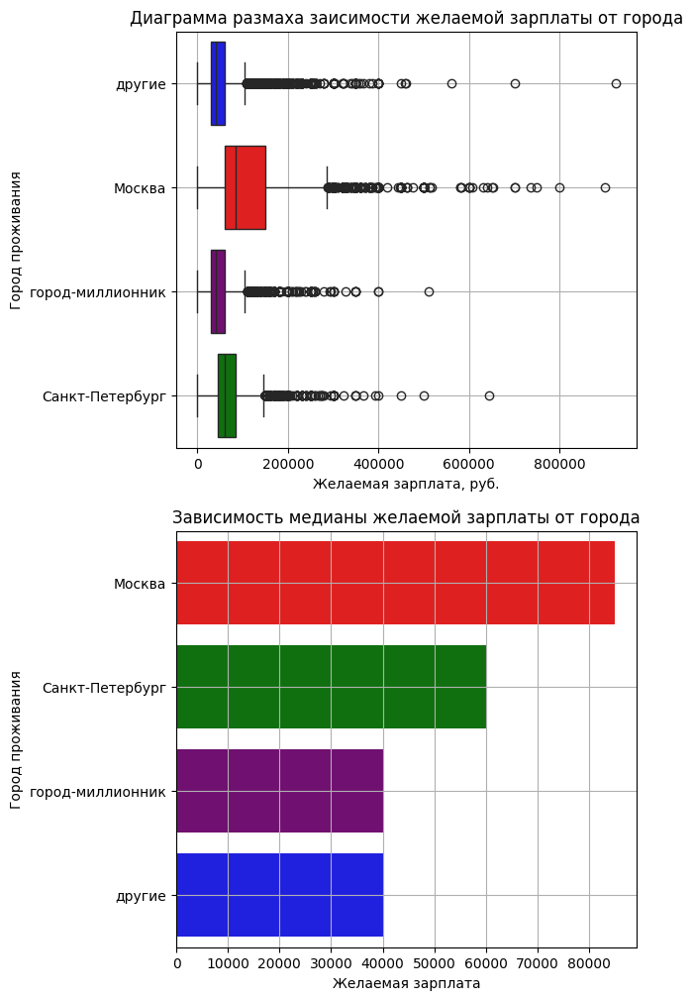

In [16]:
# Группируем отфильтрованные данные по признаку "город"
mask = (df['ЗП (руб)'] < 1000000)
data = df[mask]
bar_data = df[mask].groupby('Город', as_index=False) ['ЗП (руб)'].median()

# Строим диаграмму размаха зависимости желаемой зарплаты от города проживания
fig = px.box(
    data_frame=data,
    x='ЗП (руб)',
    y='Город',
    color='Город',
    width=840,
    height=500,
    color_discrete_map={
        'другие':'blue',
        'Москва':'red',
        'город-миллионник':'purple',
        'Санкт-Петербург':'green'
        }
    )

# Настраиваем отображение
fig.update_layout(
    title='Диаграмма размаха заисимости желаемой зарплаты от города',
    title_x = 0.5,
    xaxis_title='Желаемая зарплата',
    yaxis_title='Город проживания'
    )

fig.show()

# Строим столбчатую диаграмму
fig = px.bar(
    bar_data,
    x='ЗП (руб)',
    y='Город',
    height=500,
    width=840,
    color='Город',
    labels={'ЗП (руб)':'Медиана желаемой зарплаты', 'Город':'Город проживания'},        
    color_discrete_map={
        'другие':'blue',
        'Москва':'red',
        'город-миллионник':'purple',
        'Санкт-Петербург':'green'
        }
    )

# Настраиваем отображение
fig.update_layout(
    legend=dict(title='Статус активного клиента'),
    title='Зависимость медианы желаемой зарплаты от города',
    title_x = 0.5     
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха
fig, axes = plt.subplots(2, 1, figsize=(6, 12))
box = sns.boxplot(
    data,
    x='ЗП (руб)',
    y='Город',   
    orient='h',
    ax=axes[0],
    palette=['blue', 'red', 'purple','green']
    )

# Повышаем информативность
box.set_title('Диаграмма размаха заисимости желаемой зарплаты от города')
box.set_xlabel('Желаемая зарплата, руб.')
box.set_ylabel('Город проживания')
box.grid()

# Строим столбчатую диаграмму

bar = sns.barplot(
    bar_data,
    x='ЗП (руб)',
    y='Город',    
    ax=axes[1],
    palette=['red', 'green', 'purple', 'blue']     
    )

# Повышаем информативность
bar.set_title('Зависимость медианы желаемой зарплаты от города')
bar.set_xlabel('Желаемая зарплата')
bar.set_ylabel('Город проживания')
bar.grid()

plt.show()

**Выводы**     

- Москва демонстрирует самое высокое медианное значение ожидаемой заработной платы среди рассматриваемых категорий городов — 85 тысяч рублей, с размахом от 1 рубля до 285 тысяч рублей.
- В Санкт-Петербурге медианное значение желаемой зарплаты составляет 60 тысяч рублей, с размахом от 1 рубля до 145 тысяч рублей, что ниже, чем в Москве.
- Для городов-миллионников и городов из категории "другие" медианное значение желаемой заработной платы одинаково и составляет 40 тысяч рублей, при этом размах колеблется от 1 рубля до 105 тысяч рублей.
- Наличие предложений с минимальной зарплатой в 1 рубль во всех категориях указывает на регулярные опечатки при заполнении анкет.
- Медиана и размах ожидаемой зарплаты коррелируют с размером населения города, снижаясь от столиц к менее населенным городам.
- Самый высокий индивидуальный показатель желаемой зарплаты, около 924 тысяч рублей, был зарегистрирован в категории городов "другие".

В каком городе (категории городов) зафиксирован наибольший показатель желаемой заработной платы (~924 тысячи рублей)?
Признак города имеет важное значение при прогнозировании ожидаемой зарплаты, а наибольший показатель желаемой заработной платы был зафиксирован в городах из категории "другие".


### 6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. 
Проанализируйте график, сравнив уровень заработной платы в категориях.

/tmp/ipykernel_33530/258595629.py:52: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



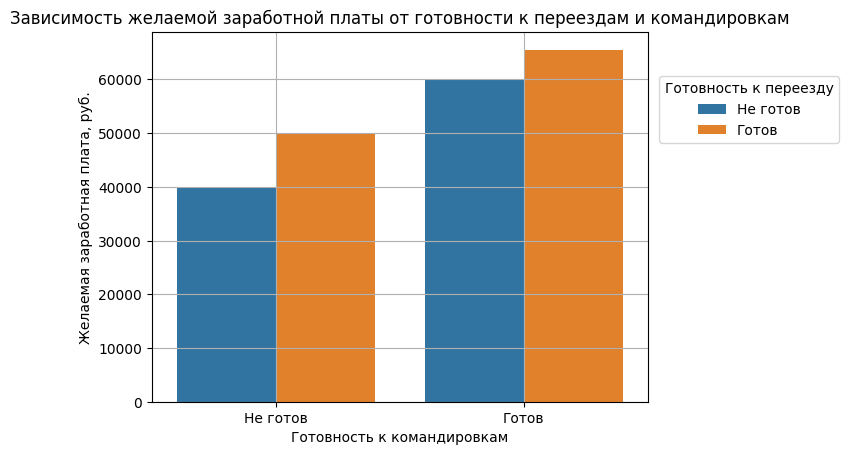

In [17]:
# Группируем отфильтрованные данные по признакам готовности к переезду и командировкам 
mask = (df['ЗП (руб)'] < 1000000)
data = df[mask].groupby(['Готовность к переезду', 'Готовность к командировкам'], as_index=False) ['ЗП (руб)'].median()

# Строим столбчатую диаграмму
fig = px.bar(
    data,
    x='Готовность к командировкам',
    y='ЗП (руб)',
    height=500,
    width=1000,
    color="Готовность к переезду",
    barmode='group',
    labels={'ЗП (руб)':'Желаемая заработная плата, руб.'},
    text=['Не готов', 'Только командировки', 'Только переезд', 'Готов ко всему']
    )

# Повышаем информативность
fig.update_xaxes(
    ticktext=["Не готов", "Готов"],
    tickvals=[False, True]
    )
fig.update_layout(  
    title='Зависимость желаемой заработной платы от готовности к переездам и командировкам',
    title_x = 0.5
    )

# Меняем подписи в легенде
newnames = {'False':"Не готов", 'True':"Готов"}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                   )
fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Строим столбчатую диаграмму

bar = sns.barplot(
    data,
    x='Готовность к командировкам',
    y='ЗП (руб)',
    hue='Готовность к переезду',
    )

# Повышаем информативность
bar.set_title('Зависимость желаемой заработной платы от готовности к переездам и командировкам')
bar.set_xlabel('Готовность к командировкам')
bar.set_ylabel('Желаемая заработная плата, руб.')
bar.grid()
bar.set(xticklabels=["Не готов", "Готов"])

# Настраиваем легенду
handles, lables= bar.get_legend_handles_labels()
lables = ["Не готов", "Готов"]
bar.legend(handles, lables, title='Готовность к переезду', loc='upper right', bbox_to_anchor=(1.4, 0.9))

plt.show()

**Выводы**

- Соискатели, готовые к командировкам и переезду, имеют наивысшую медиану ожидаемой зарплаты. Это указывает на то, что работодатели готовы предлагать более высокую зарплату за высокий уровень мобильности кандидатов.
- За ними следуют соискатели, готовые только к командировкам, а потом те, кто готов только к переезду. Это подчеркивает, что рынок труда ценит готовность к профессиональной мобильности и адаптации.
- Соискатели, не готовые к командировкам и переездам, имеют наименьшую медиану ожидаемой зарплаты, что может отражать их ограниченные возможности на рынке труда в сравнении с более мобильными кандидатами.
- Готовность к командировкам оценивается выше готовности к переезду, вероятно, из-за того, что командировки часто связаны с дополнительными требованиями к профессиональным навыкам, ответственности и самостоятельности.

Чему равна желаемая медианная заработная плата соискателей, готовых и к переезду, и к командировкам? Ответ приведите в тысячах, округлив до целого (например, 45).

66000 рублей. 


### 7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). 
На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

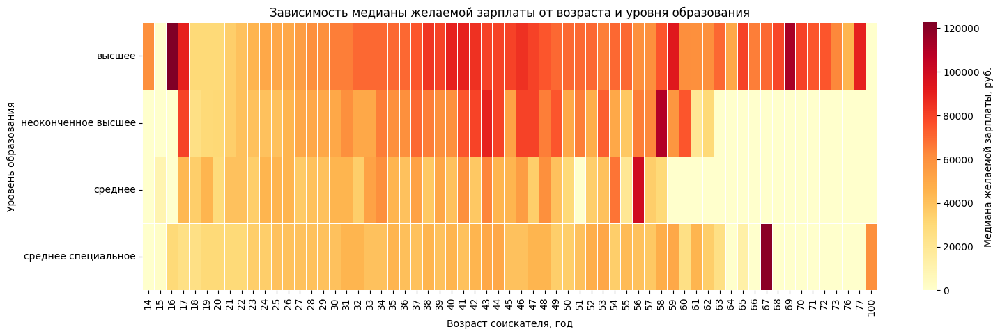

In [18]:
mask = (df['ЗП (руб)'] < 1000000)
data = df.pivot_table(values='ЗП (руб)', index='Образование', columns='Возраст', aggfunc='median', fill_value=0)

# Строим тепловую карту
fig = px.imshow(
    data,
    color_continuous_scale='YlOrRd',
    height=500,
    width=1400
    )

# Настраиваем отображение
fig.update_layout(
    title='Зависимость медианы желаемой зарплаты от возраста и уровня образования',
    title_x = 0.5,
    xaxis_title='Возраст соискателя, год',
    yaxis_title='Уровень образования',
    coloraxis_colorbar=dict(ticks='outside', ticksuffix=' руб.')
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Строим тепловую карту
fig = plt.figure(figsize=(17, 5))
fig = sns.heatmap(
    data,
    cmap='YlOrRd',
    fmt="d",
    linewidths=.5,
    cbar_kws={'label': 'Медиана желаемой зарплаты, руб.'}
    )

# Повышаем информативность
fig.set_title('Зависимость медианы желаемой зарплаты от возраста и уровня образования')
fig.set_xlabel('Возраст соискателя, год')
fig.set_ylabel('Уровень образования')

plt.show()

**Выводы**

### Высшее образование
- **Рост медианы ожидаемой зарплаты** наблюдается до 41 года, после чего следует постепенное снижение. Это может быть связано с пиком карьерного роста и переходом к поиску работы с более гибким графиком или меньшим уровнем ответственности.
- **Неравномерность** медианной зарплаты после 58 лет отражает разнообразие профессиональных интересов и потребностей в этом возрасте, включая переход на более спокойные должности или частичную занятость.
- **Распространенность** высшего образования среди всех возрастных групп, с аномалиями в данных соискателей младше 18 лет, указывающими на возможные ошибки при заполнении анкет.

### Неоконченное высшее образование
- **Рост медианы зарплаты** продолжается до 43 лет, с последующим увеличением неравномерности, возможно, из-за уменьшения количества соискателей в старших возрастных группах.
- **Аномальные значения** для возраста 17 лет, вероятно, связаны с ограниченным числом соискателей и нереалистичными ожиданиями.

### Среднее образование
- **Умеренный рост неравномерности** медианы ожидаемой зарплаты с возрастом, с выбросами в возрастах 54 и 56 лет, что может отражать уникальные навыки или опыт небольшой группы соискателей.
- **Предельный возраст** в группе — 58 лет, что может быть связано с меньшим использованием интернета для поиска работы среди старшего поколения с средним уровнем образования.

### Среднее специальное образование
- **Плавный рост медианы** ожидаемой зарплаты и увеличение неравномерности с возрастом, с аномальными значениями для 67 и 100 лет, отражающими, возможно, высокую оценку квалификации соискателями старшего возраста и ошибочные данные.

### Общие выводы
- **Зависимость** медианы ожидаемой зарплаты от уровня образования и возраста соискателей подтверждает важность этих параметров при анализе рынка труда.
- **Готовность к мобильности** и уровень профессиональной ответственности также влияют на ожидаемый уровень зарплаты.
- **Аномалии** в данных требуют дополнительного анализа, особенно в случаях с необычно высокими или низкими зарплатными ожиданиями в некоторых возрастных группах.

Для какой категории образования наблюдается самый быстрый карьерный рост (то есть интенсивность роста заработной платы наибольшая)?

С высшим образованием.

### 8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**).
 Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

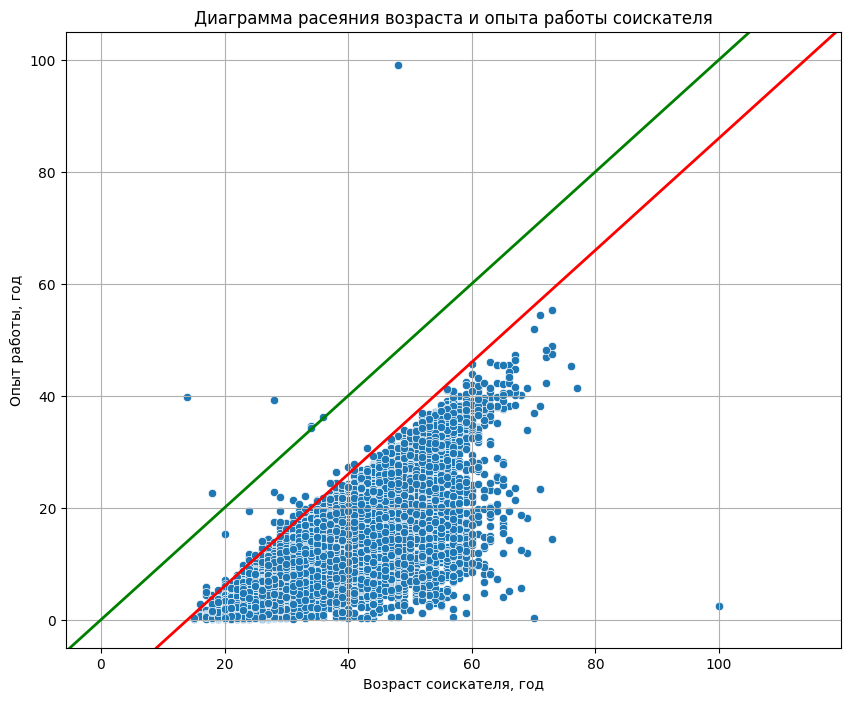

Строго выше построенной прямой лежит 7 точек


In [19]:
# Строим диграмму рассеяния
fig = px.scatter(
    df,
    y=round(df['Опыт работы (месяц)'] / 12, 2),
    x='Возраст'
    )

# Добавляем линию по координатам (0, 0) и (100, 100)
fig.add_scatter(
    x=[0,100], 
    y=[0,100], 
    line_color="green",
    showlegend=False
    )
# Добавляем линию по координатам (14, 0) и (114, 100)
fig.add_scatter(
    x=[14,114], 
    y=[0,100], 
    line_color="red",
    showlegend=False
    )

# Настраиваем отображение
fig.update_layout(
    title='Диаграмма расеяния возраста и опыта работы соискателя',
    title_x = 0.5,
    xaxis_title='Возраст соискателя, год',
    yaxis_title='Опыт работы, год'
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Строим диаграмму рассеяния 
fig = plt.figure(figsize=(10, 8))
scatter = sns.scatterplot(
    df,
    x='Возраст',
    y=round(df['Опыт работы (месяц)'] / 12, 2),
    )

# Добавляем линию по координатам (0, 0) и (100, 100)
scatter.axline(
    xy1=[0,0], 
    xy2=[100,100], 
    color='g', 
    lw='2'
    )
# Добавляем линию по координатам (14, 0) и (114, 100)
scatter.axline(
    xy1=[14,0], 
    xy2=[114,100], 
    color='r', 
    lw='2'
    )

# Повышаем информативность
scatter.set_title('Диаграмма расеяния возраста и опыта работы соискателя')
scatter.set_xlabel('Возраст соискателя, год')
scatter.set_ylabel('Опыт работы, год')
scatter.grid()
plt.show()

# Определяем количество точек выше зеленой прямой
mask = (df['Опыт работы (месяц)'] / 12) > df['Возраст']
print(f'Строго выше построенной прямой лежит {df[mask].shape[0]} точек')

**Выводы**     

Из анализа диаграммы следует, что:

- **Аномальные значения**: На диаграмме присутствуют 7 случаев, когда опыт работы соискателей превышает их возраст, что явно указывает на ошибки в заполнении данных.
- **Соискатель 100 лет**: Единственный случай соискателя в возрасте 100 лет с малым опытом работы также выделяется как аномалия, скорее всего, из-за ошибки ввода данных.
- **Соискатели с малым опытом работы**: Во всех возрастных группах, особенно до 58 лет, наблюдается значительное количество соискателей с малым опытом работы. Это может быть связано с отсутствием официального трудоустройства на предыдущих местах работы или с решением кардинально сменить профессиональную сферу, что ведет к игнорированию предыдущего опыта.
- **Ранний начало трудовой деятельности**: Некоторые соискатели указали начало трудовой деятельности до достижения 14 лет, что отделяет их от основной массы данных. В соответствии с российским законодательством, трудовые договора с лицами младше 14 лет допустимы в определенных случаях, связанных в основном с творческой деятельностью. Однако маловероятно, что все эти случаи относятся к такого рода деятельности, что указывает на вероятные ошибки при заполнении анкет.

Сколько точек лежат строго выше построенной прямой? Так как точки могут сливаться с прямой, то для ответа на этот вопрос проще всего воспользоваться интерактивной визуализацией либо получить таблицу с наблюдениями, лежащими выше прямой с помощью фильтрации.

Строго выше построенной прямой лежит 7 точек.

### Дополнительные баллы

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


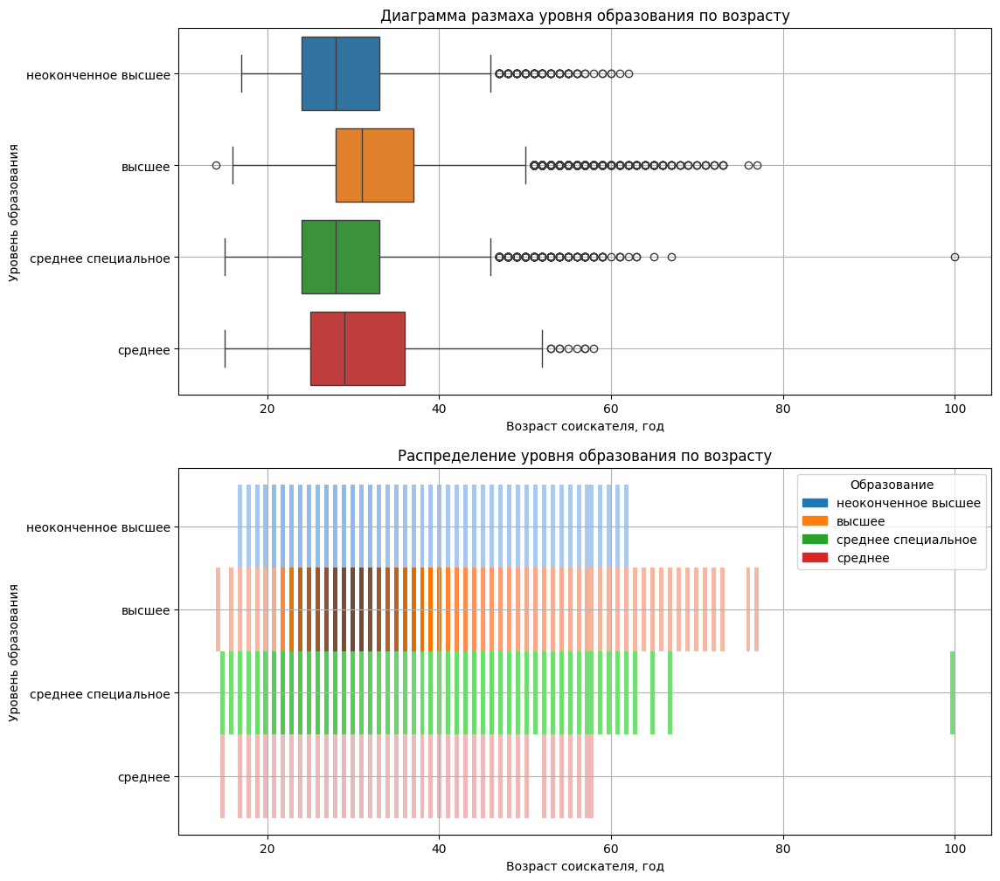

In [20]:
# Строим столбчатую диаграмму распределения уровня образования по возрасту
fig = px.histogram(
    df,
    x='Возраст',
    barmode='group',
    height=500,
    width=1000,
    color='Образование'
    )

fig.update_layout(  
    title='Распределение уровня образования по возрасту',
    xaxis_title='Возраст соискателя, год',
    title_x = 0.5,
    yaxis_title='Количество наблюдений'
    )
 
fig.show()

# Строим диаграмму размаха 
fig = px.box(
    df,
    x='Возраст',
    y='Образование',
    color='Образование',
    width=840,
    height=500,
    )

# Настраиваем отображение
fig.update_layout(
    title='Диаграмма размаха уровня образования по возрасту',
    title_x = 0.5,
    xaxis_title='Возраст соискателя, год',
    yaxis_title='Уровень образования'
    )

fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем диаграмму размаха
fig, axes = plt.subplots(2, 1, figsize=(12, 12))
box = sns.boxplot(
    data=df,
    x='Возраст',
    y='Образование',
    hue='Образование',    
    orient='h',
    ax=axes[0]
    )

# Повышаем информативность
box.set_title('Диаграмма размаха уровня образования по возрасту')
box.set_xlabel('Возраст соискателя, год')
box.set_ylabel('Уровень образования')
box.grid()

# Создаем гистограмму 
hist = sns.histplot(
    data=df,
    x='Возраст',
    y='Образование',
    hue='Образование', 
    ax=axes[1]
    )

# Повышаем информативность
hist.set_title('Распределение уровня образования по возрасту')
hist.set_xlabel('Возраст соискателя, год') 
hist.set_ylabel('Уровень образования')
hist.grid()

plt.show()

**Выводы**       

- **Логнормальное распределение**: Предположение о логнормальном распределении указывает на то, что большая часть данных сосредоточена вокруг моды с длинным хвостом в сторону более высоких значений.
- **Распределение по образованию**: Соискатели с высшим образованием составляют большинство, за ними следуют категории со средним специальным, неоконченным высшим и средним образованием по убыванию численности.
- **Возрастные пики**: Для соискателей со средним специальным образованием возрастной пик наступает в 24 года, что может соответствовать началу карьеры после окончания учебы. Для соискателей с высшим образованием возрастной пик — 30 лет, что отражает более поздний старт в профессиональной карьере, вероятно, из-за более длительного периода обучения.
- **Ожидания по зарплате**: С учетом более позднего начала карьеры и, как следствие, большего накопленного опыта работы, соискатели с высшим образованием, скорее всего, ожидают более высокого уровня зарплаты, чем соискатели со средним специальным образованием.
- **Аномальные значения**: Наличие аномальных значений, таких как соискатели в возрасте 14 лет с высшим образованием и 100 лет со средним специальным образованием, указывает на потенциальные ошибки в данных или очень редкие случаи.
- **Влияние уровня образования**: Значительное преобладание одного уровня образования над другими подтверждает его возможное существенное влияние на определение зависимостей между остальными характеристиками кандидатов.

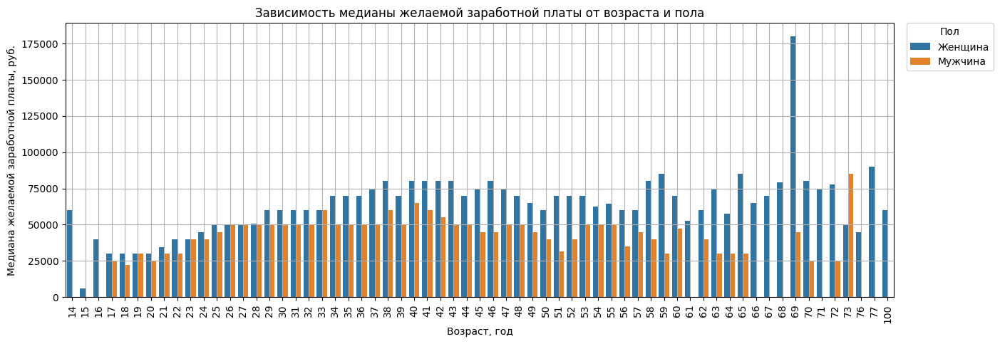

In [21]:
# Группируем данные по признакам пола и возраста
mask = (df['ЗП (руб)'] < 300000)
data_df = (df[mask])
data = df[mask].groupby(['Пол', 'Возраст'], as_index=False) ['ЗП (руб)'].median()

# Строим столбчатую диаграмму
fig = px.bar(
    data,
    x='Возраст',
    y='ЗП (руб)',
    height=500,
    width=1000,
    color='Пол',
    barmode='group',
    labels={'ЗП (руб)':'Медиана желаемой заработной платы, руб.'}
    )

# Повышаем информативность
fig.update_layout(  
    title='Зависимость медианы желаемой заработной платы от возраста и пола',
    xaxis_title='Медиана желаемой заработной платы, руб.',
    title_x = 0.5,
    yaxis_title='Возраст, год'
    )

# Меняем подписи в легенде
newnames = {'Ж':"Женщина", 'М':"Мужчина"}
fig.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                   )
 
fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Строим столбчатую диаграмму
fig = plt.figure(figsize=(15, 5))
bar = sns.barplot(
    data,
    x='Возраст',
    y='ЗП (руб)',
    hue='Пол'    
    )

# Повышаем информативность
bar.set_title('Зависимость медианы желаемой заработной платы от возраста и пола')
bar.set_xlabel('Возраст, год')
bar.set_ylabel('Медиана желаемой заработной платы, руб.')
bar.grid()
plt.xticks(rotation=90)
# Настраиваем легенду
handles, lables= bar.get_legend_handles_labels()
lables = ["Женщина", "Мужчина"]
bar.legend(
    handles,
    lables,
    title='Пол',
    loc='upper right',
    bbox_to_anchor=( 1.12 , 1 ),
    borderaxespad= 0
    )

plt.show()

**Выводы**       

- **Идентичность ожидаемой зарплаты в возрасте 23-29 лет**: Для обоих полов медианные значения ожидаемой зарплаты в этом возрастном диапазоне одинаковы, что может указывать на схожие стартовые позиции на рынке труда после окончания высшего образования или начального этапа карьерного роста.
- **Рост ожидаемой зарплаты у мужчин после 29 лет**: Это может быть связано с различиями в карьерных траекториях, амбициях, отраслях занятости или более агрессивным стремлением к повышению дохода с возрастом среди мужчин.
- **Меньший показатель среди женщин**: Предположение о влиянии декретного отпуска на ожидания женщин по заработной плате подчеркивает социальные и культурные факторы, влияющие на карьерное развитие. Перерывы в профессиональной деятельности могут влиять на рост зарплатных ожиданий у женщин.
- **Аномальное значение для 73 лет**: Такое значение может отражать не только различия в количестве соискателей по полу в данной возрастной категории, но и уникальные кейсы, связанные, например, с высоким уровнем квалификации или специализацией в определенных областях.
- **Общая тенденция**: Мужчины после 29 лет, в среднем, ожидают получать большую зарплату, что может отражать как гендерные различия в карьерных ожиданиях, так и различия в профессиональных путях и возможностях в зависимости от пола.

# Очистка данных

### 1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [22]:
# Найдем количество полных дубликатов
print(f'Количество обнаруженных полных дубликатов: {df.duplicated().sum()}')
# Удалим полные дубликаты
hh_nodup = df.drop_duplicates(ignore_index=True)
print(f'Количество удаленных полных дубликатов: {df.shape[0] - hh_nodup.shape[0]}')

# Задание 5.1
# Начнём с дубликатов в наших данных. Найдите полные дубликаты в таблице с резюме и удалите их.
# Сколько полных копий удалось найти?

Количество обнаруженных полных дубликатов: 161
Количество удаленных полных дубликатов: 161


### 2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [23]:
col_nan = hh_nodup.isnull().sum()
col = col_nan[col_nan > 0].sort_values(ascending=False)
print('Пропуски присутствуют в столбцах:')
display(col)

# Задание 5.2
# Займёмся пропусками. Выведите информацию о числе пропусков в столбцах.
# Сколько пропусков в столбце «Опыт работы (месяц)»?
print(f'Число пропусков в столбце "Опыт работы (месяц)": { col["Опыт работы (месяц)"].sum()}')

Пропуски присутствуют в столбцах:


Опыт работы (месяц)                168
Последняя/нынешняя должность         2
Последнее/нынешнее место работы      1
dtype: int64

Число пропусков в столбце "Опыт работы (месяц)": 168


### 3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. 
Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [24]:
hh_clear = hh_nodup.dropna(how='any', subset=['Последняя/нынешняя должность', 'Последнее/нынешнее место работы'])
hh_clear = hh_clear.fillna(value={'Опыт работы (месяц)':hh_clear['Опыт работы (месяц)'].median()})

# Проверим количество пропусков
col_nan = hh_clear.isnull().sum()
print(f'Количество пропусков в таблице: {col_nan.sum()}')

# Задание 5.3
# Чему равно результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков? Ответ округлите до целых.
print(
    'Результирующее среднее значение в столбце "Опыт работы (месяц)" составляет: ',
    round(hh_clear['Опыт работы (месяц)'].mean())
    )

Количество пропусков в таблице: 0
Результирующее среднее значение в столбце "Опыт работы (месяц)" составляет:  114


### 4. Мы добрались до ликвидации выбросов. 
Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [25]:
# Отфильтруем данные по заданному условию, извлечем индексы и удалим строки по полученным индексам 
mask = (hh_clear['ЗП (руб)'] > 1e6) | (hh_clear['ЗП (руб)'] < 1e3)
ind = hh_clear[mask].index
hh_clear_anom = hh_clear.drop(index=ind)

# Задание 5.4
# Сколько выбросов вы нашли?
print(f'Количество найденных выбросов: {ind.value_counts().sum()}')

Количество найденных выбросов: 89


### 5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. 
Найдите такие резюме и удалите их из данных


In [26]:
# Отфильтруем данные по заданному условию, извлечем индексы и удалим строки по полученным индексам 
mask = (hh_clear_anom['Опыт работы (месяц)'] / 12) > hh_clear_anom['Возраст']
ind = hh_clear_anom[mask].index
hh_no_anom = hh_clear_anom.drop(index=ind)

# Задание 5.5
# Сколько выбросов вы нашли?
print(f'Количество найденных выбросов: {ind.value_counts().sum()}')

Количество найденных выбросов: 7


### 6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. 
Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

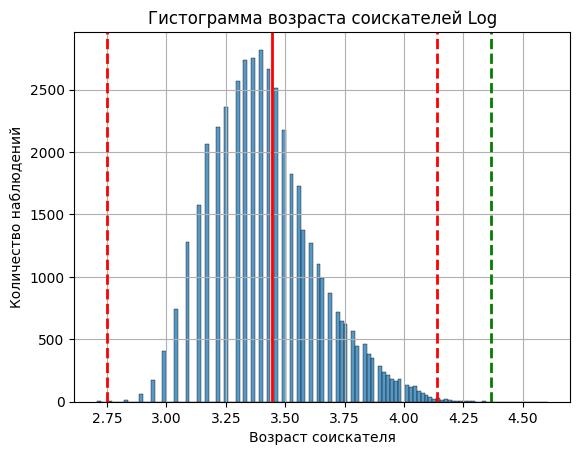

Показатель ассиметрии: 0.45
Число выбросов при границах от -3 до +3 сигм: 112
Число выбросов при границах от -3 до +4 сигм: 3


,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,...,частичная занятость,проектная работа,волонтерство,стажировка,полный день,сменный график,гибкий график,удаленная работа,вахтовый метод,ЗП (руб)
30982,Менеджер по работе с клиентами,"ООО ""ФёрстКэшКомпани""",Менеджер по работе с клиентами,2019-04-06,Не указано,среднее,М,15,2.0,Санкт-Петербург,...,True,False,False,False,False,True,True,True,False,10000.0
32795,Тестировщик игр,OOO ЖМЫХ,Тестировщик ПО,2019-04-09,Не указано,среднее специальное,М,15,3.0,другие,...,False,False,False,False,True,False,False,False,False,2000.0
33499,Frontend-разработчик,Freelance,Frontend-разработчик,2019-04-19,Не указано,среднее специальное,М,100,30.0,Санкт-Петербург,...,True,True,False,True,True,False,True,True,False,60000.0


In [27]:
# Создаем гистограмму для пролагорифмированного распределения возраста соискателей
fig = px.histogram(
    data_frame=hh_no_anom,
    x=np.log(hh_no_anom['Возраст']),   
    width=800,
    height=500,
    )
# Строим линию среднего значения для определения ассиметрии распределегия
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='solid',
    x0=np.log(hh_no_anom['Возраст']).mean(),
    x1=np.log(hh_no_anom['Возраст']).mean(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

# Сторим границы по методу z-отклонения для варианта +3, -3 и +4 сигмы 
fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='dot',
    x0=np.log(hh_no_anom['Возраст']).mean() + 3 * np.log(hh_no_anom['Возраст']).std(),
    x1=np.log(hh_no_anom['Возраст']).mean() + 3 * np.log(hh_no_anom['Возраст']).std(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

fig.add_shape(
    type='line',
    line_color='red',
    line_width=3,
    opacity=1,
    line_dash='dot',
    x0=np.log(hh_no_anom['Возраст']).mean() - 3 * np.log(hh_no_anom['Возраст']).std(),
    x1=np.log(hh_no_anom['Возраст']).mean() - 3 * np.log(hh_no_anom['Возраст']).std(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

fig.add_shape(
    type='line',
    line_color='green',
    line_width=3,
    opacity=1,
    line_dash='dot',
    x0=np.log(hh_no_anom['Возраст']).mean() + 4 * np.log(hh_no_anom['Возраст']).std(),
    x1=np.log(hh_no_anom['Возраст']).mean() + 4 * np.log(hh_no_anom['Возраст']).std(),
    xref='x',
    y0=0,
    y1=3000,
    yref='y'
    )

# Настраиваем отображение
fig.update_layout(
    title='Распределение возраста соискателей Log',
    title_x = 0.5,
    xaxis_title='Возраст соискателей',
    yaxis_title='Число наблюдений'
    )
    
fig.show()

#Построение графиков в seaborn для корректного отображения на GitHub
# Создаем гистограмму для пролагорифмированного распределения
hist = sns.histplot(
    data=hh_no_anom, 
    x=np.log(hh_no_anom['Возраст']),
    )

# Строим линию среднего значения для определения ассиметрии распределегия
hist.axvline(np.log(hh_no_anom['Возраст']).mean(), color='r', lw='2')

# Сторим границы по методу z-отклонения для варианта +3, -3 и +4 сигмы 
hist.axvline(np.log(hh_no_anom['Возраст']).mean() + 3 * np.log(hh_no_anom['Возраст']).std(), color='r', lw='2', ls='--')
hist.axvline(np.log(hh_no_anom['Возраст']).mean() - 3 * np.log(hh_no_anom['Возраст']).std(), color='r', lw='2', ls='--')
hist.axvline(np.log(hh_no_anom['Возраст']).mean() + 4 * np.log(hh_no_anom['Возраст']).std(), color='g', lw='2', ls='--')

# Повышаем информативность
hist.set_title('Гистограмма возраста соискателей Log')
hist.set_xlabel('Возраст соискателя') 
hist.set_ylabel('Количество наблюдений')
hist.grid()
plt.show()

# Вычислим численный показатель ассиметрии рапределения
print('Показатель ассиметрии:', round(np.log(df['Возраст']).skew(), 2))

# Для нахождения выбросов воспользуемся функцией из модуля по очистке данных
def outliers_z_score_mod(data, feature, log_scale=False, left=3, right=3, shift=0):
    """Функция анализирует полученный DataFrame по целевому признаку по методу z-отклонения и разделяет его на DataFrame
    с очищенными данными и с полученными выбросами. 
    
    Args:
        data (pd.DataFrame):исходный DataFrame
        feature (int, float): целевой признак
        log_scale (bool, optional): применять или нет логарифмический масштаб, по умолчанию - нет
        left (int, optional): применяемое количество стандартных квадратичных отклонений слева, по умолчанию 3
        right (int, optional): применяемое количество стандартных квадратичных отклонений справа, по умолчанию 3
        shift (int): коэффициент смещения, если признак содержит нулевые значения следует установить 1, по умолчанию - 0
        
    Returns:
        pd.DataFrame: возвращает два DataFrame, первый содержит выбросы, второй - очищенные данные
    """
    if log_scale:
        x = np.log(data[feature]+shift)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned


# Найдем число выбросов методом z-отклонений для границ +/-3 сигмы         
outliers, cleaned = outliers_z_score_mod(hh_no_anom, 'Возраст', log_scale=True)       
print(f'Число выбросов при границах от -3 до +3 сигм: {outliers.shape[0]}')

# Найдем число выбросов методом z-отклонений для границ +4/-3 сигмы  
outliers, cleaned = outliers_z_score_mod(hh_no_anom, 'Возраст', right=4, log_scale=True)        
print(f'Число выбросов при границах от -3 до +4 сигм: {outliers.shape[0]}')

# Сохраним очищенные данные и выведем таблицу с выбросами
clean_data = cleaned
display(outliers)

**Выводы**

- **Нормальное распределение в логарифмическом масштабе**: Подтверждает общую тенденцию к правой асимметрии в распределении, что характерно для данных с односторонним "хвостом" высоких значений.
- **Правая асимметрия**: Показатель асимметрии (As=0.45) и наличие большего числа наблюдений справа от моды подчеркивают этот факт.
- **Выбросы начиная с 63 лет**: На основе z-отклонений выявлены потенциальные выбросы, но их реальность ставится под сомнение из-за социальных и экономических обстоятельств, включая пенсионный возраст в России.
- **Расширение границ до 4 сигм**: Уменьшает количество потенциальных выбросов до одного, что говорит о нормальности большинства данных вне зависимости от использованного метода для определения выбросов.
- **Анализ аномалий**: Выделение трех аномальных значений (два 15-летних соискателя и один 100-летний) подчеркивает важность контекстного анализа данных. При этом соискатели 15 лет могут быть вполне реальными кандидатами для указанных вакансий, что подтверждает реалистичность их опыта работы и ожидаемой зарплаты.

Сколько выбросов вы нашли с помощью метода z-отклонений?         
Число выбросов при границах от -3 до +4 сигм: 3